TODO:
- for each Assembly (central, elite, local):
  - Map
  - What other mechanisms, etc. are associated? 
- Timeline (all)

### Imports

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches

%matplotlib inline 
mpl.rcParams['figure.dpi'] = 300

In [3]:
from sklearn.preprocessing import Normalizer

In [4]:
from chart_studio import plotly
import plotly.figure_factory as ff

In [5]:
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 4000

In [6]:
DATA_VERSION = 'v4'

In [7]:
fig_dir = '../' + DATA_VERSION + '-fig/fig-assemblies/SCCS/'

In [8]:
gov_arch_csv = '../data/' + DATA_VERSION + '/communities_data_prepped.csv'

In [9]:
gov_df = pd.read_csv(gov_arch_csv)

In [10]:
gov_df.head()

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_frequent_and_or_regular_meetings,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_council_central_,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_board_committee,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_criticism_mocking_joking,access_mechanisms_include_age_boundaries,access_mechanisms_include_popularity_,access_mechanisms_include_co-optation,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_autocratic_leader_chief_bound,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_destruction_of_property,access_mechanisms_include_heredity,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_tribunal_court_,enforcement_mechanisms_include_forced_labour,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_petition,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_arbitration,access_mechanisms_include_screening_process,enforcement_mechanisms_include_self-help,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_delegation,access_mechanisms_include_dreaming,access_mechanisms_include_blood_relations,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,decision_making_mechanisms_include_lobbying,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_include_divine_right,decision_making_mechanisms_include_leader_first_among_equals,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,access_mechanisms_include_meritocracy,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_remunerated_position,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_vote_by_proxy,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_appeal,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_voting,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_gathering,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_group_votin

In [11]:
# SCCS-only 
gov_df = gov_df.loc[gov_df['is_SCCS'] == 1]

In [12]:
gov_df['is_SCCS']

65    1
66    1
67    1
68    1
69    1
70    1
71    1
72    1
73    1
74    1
75    1
76    1
77    1
78    1
79    1
80    1
81    1
82    1
83    1
84    1
85    1
86    1
87    1
88    1
89    1
90    1
Name: is_SCCS, dtype: int64

In [13]:
gov_df

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_frequent_and_or_regular_meetings,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_council_central_,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_board_committee,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_criticism_mocking_joking,access_mechanisms_include_age_boundaries,access_mechanisms_include_popularity_,access_mechanisms_include_co-optation,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_autocratic_leader_chief_bound,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_destruction_of_property,access_mechanisms_include_heredity,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_tribunal_court_,enforcement_mechanisms_include_forced_labour,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_petition,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_arbitration,access_mechanisms_include_screening_process,enforcement_mechanisms_include_self-help,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_delegation,access_mechanisms_include_dreaming,access_mechanisms_include_blood_relations,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,decision_making_mechanisms_include_lobbying,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_include_divine_right,decision_making_mechanisms_include_leader_first_among_equals,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,access_mechanisms_include_meritocracy,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_remunerated_position,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_vote_by_proxy,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_appeal,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_voting,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_gathering,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_group_votin

# Assemblies Analysis

#### Create categories for elite/no elite for central and local 

In [14]:
assemblies = [
 'decision_making_mechanisms_include_assembly_central',
 'decision_making_mechanisms_include_assembly_central_elite',
 'decision_making_mechanisms_include_assembly_central_no_elite',
 'decision_making_mechanisms_include_assembly_local',
 'decision_making_mechanisms_include_assembly_local_elite',
 'decision_making_mechanisms_include_assembly_local_no_elite',
 'decision_making_mechanisms_include_assembly_elite',
]

In [15]:
central_assemblies = [
 'decision_making_mechanisms_include_assembly_central',
 'decision_making_mechanisms_include_assembly_central_elite',
 'decision_making_mechanisms_include_assembly_central_no_elite',
]

In [16]:
local_assemblies = [
 'decision_making_mechanisms_include_assembly_local',
 'decision_making_mechanisms_include_assembly_local_elite',
 'decision_making_mechanisms_include_assembly_local_no_elite',
]

In [17]:
gov_df['decision_making_mechanisms_include_assembly_central_elite'] = np.where(((gov_df['decision_making_mechanisms_include_assembly_central'] == 1) & (gov_df['decision_making_mechanisms_include_assembly_elite'] == 1)), 1, 0)

In [18]:
gov_df['decision_making_mechanisms_include_assembly_central_no_elite'] = np.where(((gov_df['decision_making_mechanisms_include_assembly_central'] == 1) & (gov_df['decision_making_mechanisms_include_assembly_elite'] == 0)), 1, 0)

In [19]:
gov_df['decision_making_mechanisms_include_assembly_local_elite'] = np.where(((gov_df['decision_making_mechanisms_include_assembly_local'] == 1) & (gov_df['decision_making_mechanisms_include_assembly_elite'] == 1)), 1, 0)

In [20]:
gov_df['decision_making_mechanisms_include_assembly_local_no_elite'] = np.where(((gov_df['decision_making_mechanisms_include_assembly_local'] == 1) & (gov_df['decision_making_mechanisms_include_assembly_elite'] == 0)), 1, 0)

In [21]:
gov_df[assemblies].head()

,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
65,0,0,0,0,0,0,0
66,0,0,0,0,0,0,0
67,0,0,0,0,0,0,0
68,0,0,0,0,0,0,0
69,0,0,0,1,0,1,0


In [22]:
gov_df[assemblies].sum()

decision_making_mechanisms_include_assembly_central             1
decision_making_mechanisms_include_assembly_central_elite       0
decision_making_mechanisms_include_assembly_central_no_elite    1
decision_making_mechanisms_include_assembly_local               2
decision_making_mechanisms_include_assembly_local_elite         0
decision_making_mechanisms_include_assembly_local_no_elite      2
decision_making_mechanisms_include_assembly_elite               0
dtype: int64

## Correlations

In [23]:
data_plot = gov_df.select_dtypes(include=[np.number])

In [24]:
data_plot

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_frequent_and_or_regular_meetings,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_council_central_,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_board_committee,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_criticism_mocking_joking,access_mechanisms_include_age_boundaries,access_mechanisms_include_popularity_,access_mechanisms_include_co-optation,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_autocratic_leader_chief_bound,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_destruction_of_property,access_mechanisms_include_heredity,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_tribunal_court_,enforcement_mechanisms_include_forced_labour,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_petition,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_arbitration,access_mechanisms_include_screening_process,enforcement_mechanisms_include_self-help,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_delegation,access_mechanisms_include_dreaming,access_mechanisms_include_blood_relations,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,decision_making_mechanisms_include_lobbying,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_include_divine_right,decision_making_mechanisms_include_leader_first_among_equals,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,access_mechanisms_include_meritocracy,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_remunerated_position,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_vote_by_proxy,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_appeal,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_voting,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_gathering,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_council_local,access_mechanisms_include_enfranchisement,decision_making_mechanisms_

In [25]:
data_plot.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_frequent_and_or_regular_meetings,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_council_central_,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_board_committee,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_criticism_mocking_joking,access_mechanisms_include_age_boundaries,access_mechanisms_include_popularity_,access_mechanisms_include_co-optation,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_autocratic_leader_chief_bound,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_destruction_of_property,access_mechanisms_include_heredity,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_tribunal_court_,enforcement_mechanisms_include_forced_labour,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_petition,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_arbitration,access_mechanisms_include_screening_process,enforcement_mechanisms_include_self-help,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_delegation,access_mechanisms_include_dreaming,access_mechanisms_include_blood_relations,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,decision_making_mechanisms_include_lobbying,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_include_divine_right,decision_making_mechanisms_include_leader_first_among_equals,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,access_mechanisms_include_meritocracy,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_remunerated_position,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_vote_by_proxy,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_appeal,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_voting,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_gathering,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_council_local,access_mechanisms_include_enfranchisement,decision_making_mechanisms_

In [26]:
normalized = Normalizer().fit_transform(data_plot)

norm_df = pd.DataFrame(normalized)
norm_df.columns = data_plot.columns
norm_corr = norm_df.corr()

norm_corr.head()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_frequent_and_or_regular_meetings,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_council_central_,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_board_committee,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_criticism_mocking_joking,access_mechanisms_include_age_boundaries,access_mechanisms_include_popularity_,access_mechanisms_include_co-optation,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_autocratic_leader_chief_bound,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_destruction_of_property,access_mechanisms_include_heredity,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_tribunal_court_,enforcement_mechanisms_include_forced_labour,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_petition,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_arbitration,access_mechanisms_include_screening_process,enforcement_mechanisms_include_self-help,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_delegation,access_mechanisms_include_dreaming,access_mechanisms_include_blood_relations,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,decision_making_mechanisms_include_lobbying,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_include_divine_right,decision_making_mechanisms_include_leader_first_among_equals,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,access_mechanisms_include_meritocracy,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_remunerated_position,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_vote_by_proxy,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_appeal,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_voting,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_gathering,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_council_local,access_mechanisms_include_enfranchisement,decision_making_mechanisms_

In [27]:
assemblies_corr = norm_corr[assemblies]

In [28]:
assemblies_corr

,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
Time span: Start,-0.368087,NaN,-0.368087,0.127786,NaN,0.127786,NaN
Time span: End,0.379220,NaN,0.379220,-0.125884,NaN,-0.125884,NaN
is_SCCS,0.163809,NaN,0.163809,-0.153525,NaN,-0.153525,NaN
decision_making_mechanisms_include_frequent_and_or_regular_meetings,-0.057729,NaN,-0.057729,-0.083319,NaN,-0.083319,NaN
enforcement_mechanisms_include_capital_punishment,-0.057728,NaN,-0.057728,-0.083317,NaN,-0.083317,NaN
decision_making_mechanisms_include_deliberation,0.165775,NaN,0.165775,0.196298,NaN,0.196298,NaN
decision_making_mechanisms_include_power_fluidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN
decision_making_mechanisms_include_council_central_,-0.273591,NaN,-0.273591,-0.110729,NaN,-0.110729,NaN
enforcement_mechanisms_include_seizing_of_property,-0.040000,NaN,-0.040000,-0.057731,NaN,-0.057731,NaN
decision_making_mechanisms_include_board_committee,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
plt.figure(figsize=(30,30))
sns.heatmap(
    assemblies_corr, 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'all_assemblies_unsorted_corr.png', bbox_inches='tight')
plt.show()

In [ ]:
plt.figure(figsize=(30,30))
sns.heatmap(
    assemblies_corr.sort_values(by='decision_making_mechanisms_include_assembly_central', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'all_assemblies_corr.png')
plt.show()

In [31]:
plt.figure(figsize=(30,30))
sns.heatmap(
    assemblies_corr[central_assemblies].sort_values(by='decision_making_mechanisms_include_assembly_central', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'central_assemblies_corr.png')
plt.show()

In [ ]:
plt.figure(figsize=(30,30))
sns.heatmap(
    assemblies_corr[local_assemblies].sort_values(by='decision_making_mechanisms_include_assembly_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'local_assemblies_corr.png')
plt.show()

### Filter by mechanism type: Access, Enforcement, Decision Making

In [33]:
col_list = list(gov_df.columns.values)
col_list

['Name',
 'Institutions',
 'Mechanism',
 'Notes',
 'Time span',
 'Geography',
 'Size',
 'Source',
 'Metanotes',
 'Heterogeneity ',
 'FC comments',
 'expert check',
 'Time span: Start',
 'Time span: End',
 'SCCS',
 'is_SCCS',
 'decision_making_mechanisms_include_frequent_and_or_regular_meetings',
 'enforcement_mechanisms_include_capital_punishment',
 'decision_making_mechanisms_include_deliberation',
 'decision_making_mechanisms_include_power_fluidity',
 'decision_making_mechanisms_include_council_central_',
 'enforcement_mechanisms_include_seizing_of_property',
 'decision_making_mechanisms_include_board_committee',
 'enforcement_mechanisms_include_monitoring',
 'decision_making_mechanisms_include_bureaucracy',
 'enforcement_mechanisms_include_fines',
 'decision_making_mechanisms_include_plurality_voting',
 'enforcement_mechanisms_include_criticism_mocking_joking',
 'access_mechanisms_include_age_boundaries',
 'access_mechanisms_include_popularity_',
 'access_mechanisms_include_co-optat

#### Access mechanisms

In [34]:
access_cols = [col for col in col_list if col.startswith('access_')]
access_cols

['access_mechanisms_include_age_boundaries',
 'access_mechanisms_include_popularity_',
 'access_mechanisms_include_co-optation',
 'access_mechanisms_include_gerontocracy',
 'access_mechanisms_include_heredity',
 'access_mechanisms_include_matriarchy',
 'access_mechanisms_include_matrilineality',
 'access_mechanisms_include_life_appointment',
 'access_mechanisms_include_screening_process',
 'access_mechanisms_include_patronage_for_office',
 'access_mechanisms_include_dreaming',
 'access_mechanisms_include_blood_relations',
 'access_mechanisms_include_election',
 'access_mechanisms_include_divine_right',
 'access_mechanisms_include_open_political_unit',
 'access_mechanisms_include_meritocracy',
 'access_mechanisms_include_lottery_random_selection',
 'access_mechanisms_include_induction_rite_ceremony',
 'access_mechanisms_include_enfranchisement',
 'access_mechanisms_include_child_participation',
 'access_mechanisms_include_female_participation',
 'access_mechanisms_include_property_requi

In [35]:
access_corr = assemblies_corr.loc[access_cols]
access_corr.head()

,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
access_mechanisms_include_age_boundaries,-0.072029,NaN,-0.072029,-0.103957,NaN,-0.103957,NaN
access_mechanisms_include_popularity_,-0.085275,NaN,-0.085275,-0.123074,NaN,-0.123074,NaN
access_mechanisms_include_co-optation,NaN,NaN,NaN,NaN,NaN,NaN,NaN
access_mechanisms_include_gerontocracy,0.137178,NaN,0.137178,0.152579,NaN,0.152579,NaN
access_mechanisms_include_heredity,-0.298929,NaN,-0.298929,0.179190,NaN,0.179190,NaN


In [ ]:
# plt.figure(figsize=(40,40))
sns.heatmap(
    access_corr.sort_values(by='decision_making_mechanisms_include_assembly_central', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'mechanisms_corr_access.png', bbox_inches='tight')
plt.show()

/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_67532/3067452565.py:10: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


#### Enforcement mechanisms

In [ ]:
enforcement_cols = [col for col in col_list if col.startswith('enforcement_')]
enforcement_cols

In [ ]:
enforcement_corr = assemblies_corr.loc[enforcement_cols]
enforcement_corr.head()

In [ ]:
# plt.figure(figsize=(40,40))
sns.heatmap(
    enforcement_corr.sort_values(by='decision_making_mechanisms_include_assembly_central', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'mechanisms_corr_enforcement.png', bbox_inches='tight')
plt.show()

/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_67532/3729512812.py:10: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


#### Decision making mechanisms

In [ ]:
decision_making_cols = [col for col in col_list if col.startswith('decision_making_')]
decision_making_cols

['decision_making_mechanisms_include_frequent_and_or_regular_meetings',
 'decision_making_mechanisms_include_deliberation',
 'decision_making_mechanisms_include_power_fluidity',
 'decision_making_mechanisms_include_council_central_',
 'decision_making_mechanisms_include_board_committee',
 'decision_making_mechanisms_include_bureaucracy',
 'decision_making_mechanisms_include_plurality_voting',
 'decision_making_mechanisms_include_ratification_acclamation_only',
 'decision_making_mechanisms_include_constitution',
 'decision_making_mechanisms_include_autocratic_leader_chief_bound',
 'decision_making_mechanisms_include_checks_and_balances',
 'decision_making_mechanisms_include_quorum',
 'decision_making_mechanisms_include_petition',
 'decision_making_mechanisms_include_confederacy',
 'decision_making_mechanisms_include_balance_of_power',
 'decision_making_mechanisms_include_delegation',
 'decision_making_mechanisms_include_mandate',
 'decision_making_mechanisms_include_autocratic_leader_un

In [41]:
decision_making_corr = assemblies_corr.loc[decision_making_cols]
decision_making_corr.head()

,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
decision_making_mechanisms_include_frequent_and_or_regular_meetings,-0.057729,NaN,-0.057729,-0.083319,NaN,-0.083319,NaN
decision_making_mechanisms_include_deliberation,0.165775,NaN,0.165775,0.196298,NaN,0.196298,NaN
decision_making_mechanisms_include_power_fluidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN
decision_making_mechanisms_include_council_central_,-0.273591,NaN,-0.273591,-0.110729,NaN,-0.110729,NaN
decision_making_mechanisms_include_board_committee,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(
    decision_making_corr.sort_values(by='decision_making_mechanisms_include_assembly_central', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'mechanisms_corr_decision_making.png', bbox_inches='tight')
plt.show()

### Size correlations

In [43]:
size_cols = [col for col in col_list if col.startswith('Size:')]
size_cols

['Size: 100 - 1,000',
 'Size: 1,001 - 10,000',
 'Size: 10,001 - 100,000',
 'Size: 100,001 - 1,000,000',
 'Size: 1,000,001 - 10,000,000',
 'Size: 10,000,000+',
 'Size: Unknown']

In [44]:
size_corr = assemblies_corr.loc[size_cols]
size_corr.head()

,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
"Size: 100 - 1,000",-0.085275,NaN,-0.085275,0.269766,NaN,0.269766,NaN
"Size: 1,001 - 10,000",-0.171114,NaN,-0.171114,-0.246963,NaN,-0.246963,NaN
"Size: 10,001 - 100,000",0.360146,NaN,0.360146,0.156584,NaN,0.156584,NaN
"Size: 100,001 - 1,000,000",-0.057718,NaN,-0.057718,-0.083303,NaN,-0.083303,NaN
"Size: 1,000,001 - 10,000,000",NaN,NaN,NaN,NaN,NaN,NaN,NaN


/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_67532/401215558.py:10: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


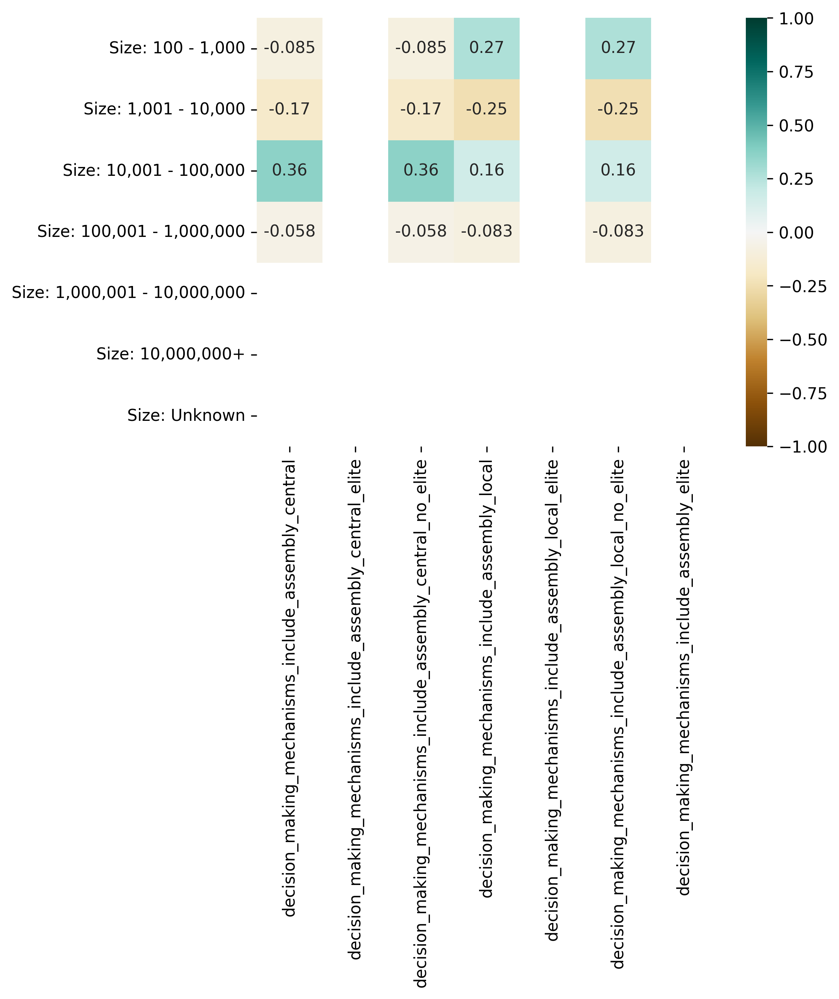

In [45]:
# plt.figure(figsize=(40,40))
sns.heatmap(
    size_corr, 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'mechanisms_corr_size.png', bbox_inches='tight')
plt.show()

### Get correlations for each assembly type

#### Central assemblies

In [46]:
central_corr = assemblies_corr['decision_making_mechanisms_include_assembly_central']

In [47]:
central_corr.sort_values(ascending=False).to_csv('../csv/' + DATA_VERSION + '/SCCS/assemblies_central_corr.csv')

In [48]:
central_corr.sort_values(ascending=False)

decision_making_mechanisms_include_assembly_central                                1.000000
Geography: Oceania, Kiribati                                                       1.000000
decision_making_mechanisms_include_assembly_central_no_elite                       1.000000
decision_making_mechanisms_include_checks_and_balances                             0.713255
enforcement_mechanisms_include_jury_judge                                          0.568616
enforcement_mechanisms_include_arbitration                                         0.486607
enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator    0.440529
decision_making_mechanisms_include_gathering                                       0.437353
Region: Oceania                                                                    0.437004
Time span: End                                                                     0.379220
Time span: Duration                                                             

In [49]:
central_corr.sort_values(ascending=True)

Time span: Start                                                                  -0.368087
access_mechanisms_include_meritocracy                                             -0.327886
access_mechanisms_include_heredity                                                -0.298929
decision_making_mechanisms_include_council_central_                               -0.273591
Size: 1,001 - 10,000                                                              -0.171114
Region: North America                                                             -0.145495
access_mechanisms_include_life_appointment                                        -0.133308
access_mechanisms_include_female_participation                                    -0.121327
access_mechanisms_include_election                                                -0.121111
decision_making_mechanisms_include_public_meetings                                -0.121063
Geography: North America                                                        

In [50]:
central_corr.sort_values(ascending=False).to_frame()

,decision_making_mechanisms_include_assembly_central
decision_making_mechanisms_include_assembly_central,1.000000
"Geography: Oceania, Kiribati",1.000000
decision_making_mechanisms_include_assembly_central_no_elite,1.000000
decision_making_mechanisms_include_checks_and_balances,0.713255
enforcement_mechanisms_include_jury_judge,0.568616
enforcement_mechanisms_include_arbitration,0.486607
enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,0.440529
decision_making_mechanisms_include_gathering,0.437353
Region: Oceania,0.437004
Time span: End,0.379220


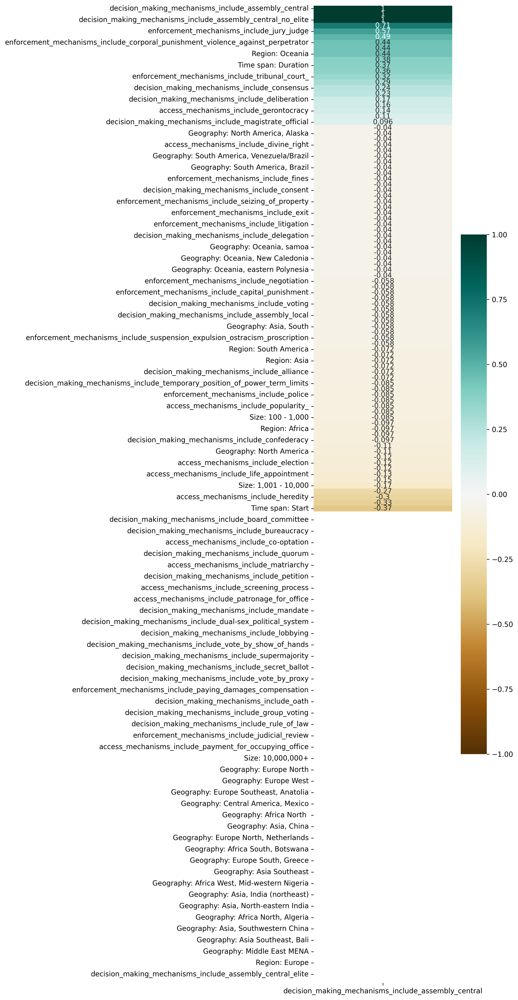

In [51]:
plt.figure(figsize=(10,20))
sns.heatmap(
    central_corr.sort_values(ascending=False).to_frame(),
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'central_assemblies_corr.png')
plt.show()

In [52]:
central_elite_corr = assemblies_corr['decision_making_mechanisms_include_assembly_central_elite']

In [53]:
central_elite_corr.sort_values(ascending=False).to_csv('../csv/' + DATA_VERSION + '/SCCS/assemblies_central_elite_corr.csv')

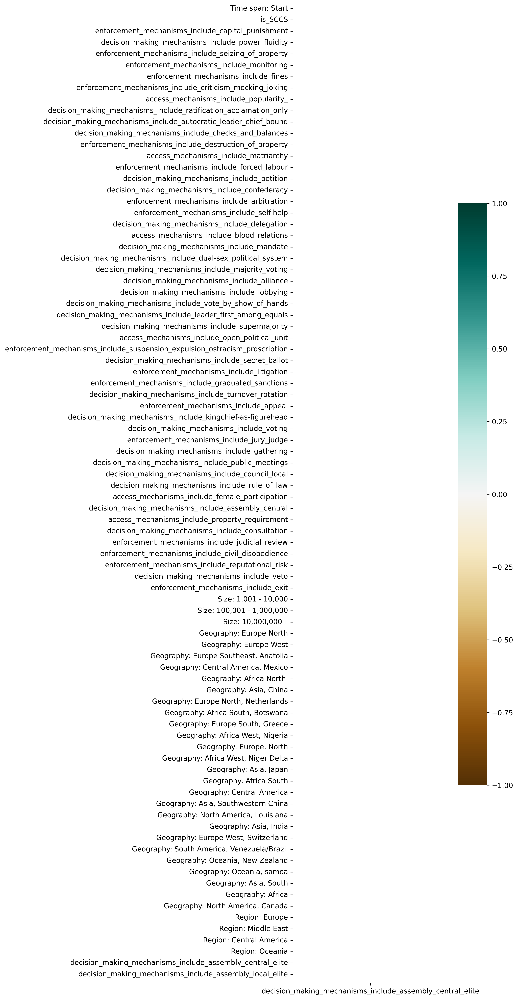

In [54]:
plt.figure(figsize=(10,20))
sns.heatmap(
    central_elite_corr.sort_values(ascending=False).to_frame(),
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'central_elite_assemblies_corr.png')
plt.show()

In [55]:
central_elite_corr = assemblies_corr['decision_making_mechanisms_include_assembly_central_no_elite']

In [56]:
central_elite_corr.sort_values(ascending=False).to_csv('../csv/' + DATA_VERSION + '/SCCS/assemblies_central_no_elite_corr.csv')

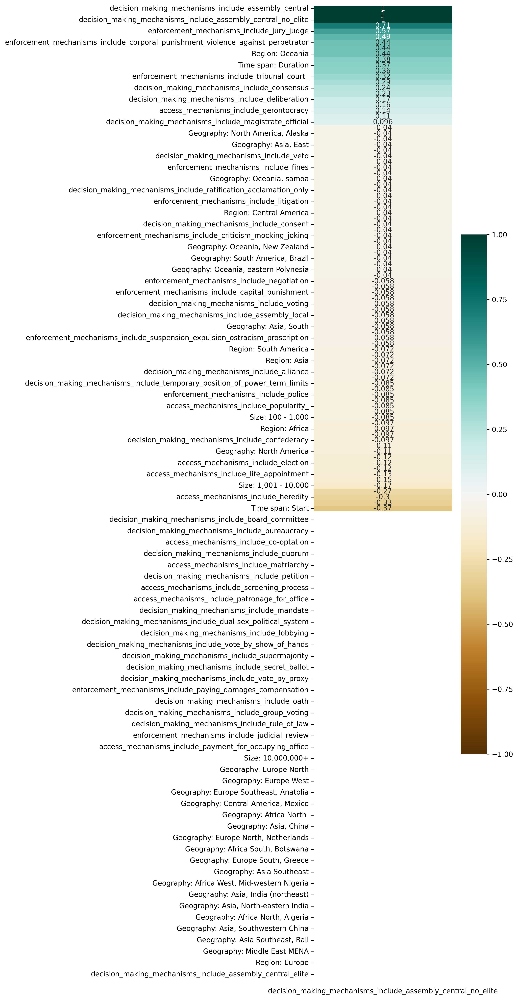

In [57]:
plt.figure(figsize=(10,20))
sns.heatmap(
    central_elite_corr.sort_values(ascending=False).to_frame(),
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'central_no_elite_assemblies_corr.png')
plt.show()

#### Local Assemblies

In [58]:
local_corr = assemblies_corr['decision_making_mechanisms_include_assembly_local']

In [59]:
local_corr.sort_values(ascending=False).to_csv('../csv/' + DATA_VERSION + '/SCCS/assemblies_local_corr.csv')

In [60]:
local_corr.sort_values(ascending=False)

decision_making_mechanisms_include_assembly_local_no_elite                         1.000000
decision_making_mechanisms_include_assembly_local                                  1.000000
Geography: Oceania, New Zealand                                                    0.701729
enforcement_mechanisms_include_criticism_mocking_joking                            0.683804
access_mechanisms_include_child_participation                                      0.681828
access_mechanisms_include_female_participation                                     0.473243
decision_making_mechanisms_include_public_meetings                                 0.445000
Size: 100 - 1,000                                                                  0.269766
decision_making_mechanisms_include_unanimity                                       0.265180
Region: Oceania                                                                    0.227467
decision_making_mechanisms_include_deliberation                                 

In [61]:
local_corr.sort_values(ascending=True)

Size: 1,001 - 10,000                                                              -0.246963
enforcement_mechanisms_include_tribunal_court_                                    -0.192286
access_mechanisms_include_election                                                -0.174795
access_mechanisms_include_meritocracy                                             -0.163544
decision_making_mechanisms_include_consultation                                   -0.157814
is_SCCS                                                                           -0.153525
enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator   -0.140755
decision_making_mechanisms_include_gathering                                      -0.140670
decision_making_mechanisms_include_confederacy                                    -0.140653
Geography: Africa                                                                 -0.140640
Region: Africa                                                                  

In [ ]:
plt.figure(figsize=(10,20))
sns.heatmap(
    local_corr.sort_values(ascending=False).to_frame(),
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'local_assemblies_corr.png')
plt.show()

In [ ]:
local_elite_corr = assemblies_corr['decision_making_mechanisms_include_assembly_local_elite']

In [64]:
local_elite_corr.sort_values(ascending=False).to_csv('../csv/' + DATA_VERSION + '/SCCS/assemblies_local_corr_elite.csv')

In [ ]:
plt.figure(figsize=(10,20))
sns.heatmap(
    local_elite_corr.sort_values(ascending=False).to_frame(),
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'local_elite_assemblies_corr.png')
plt.show()

In [66]:
local_no_elite_corr = assemblies_corr['decision_making_mechanisms_include_assembly_local_no_elite']

In [67]:
local_no_elite_corr.sort_values(ascending=False).to_csv('../csv/' + DATA_VERSION + '/SCCS/assemblies_local_corr_no_elite.csv')

In [ ]:
plt.figure(figsize=(10,20))
sns.heatmap(
    local_no_elite_corr.sort_values(ascending=False).to_frame(),
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'local_no_elite_assemblies_corr.png')
plt.show()

#### Elite Assemblies

In [69]:
elite_corr = assemblies_corr['decision_making_mechanisms_include_assembly_elite']

In [70]:
elite_corr.sort_values(ascending=False).to_csv('../csv/' + DATA_VERSION + '/SCCS/assemblies_elite_corr.csv')

In [71]:
elite_corr.sort_values(ascending=False)

Time span: Start                                                                  NaN
Time span: End                                                                    NaN
is_SCCS                                                                           NaN
decision_making_mechanisms_include_frequent_and_or_regular_meetings               NaN
enforcement_mechanisms_include_capital_punishment                                 NaN
decision_making_mechanisms_include_deliberation                                   NaN
decision_making_mechanisms_include_power_fluidity                                 NaN
decision_making_mechanisms_include_council_central_                               NaN
enforcement_mechanisms_include_seizing_of_property                                NaN
decision_making_mechanisms_include_board_committee                                NaN
enforcement_mechanisms_include_monitoring                                         NaN
decision_making_mechanisms_include_bureaucracy        

In [72]:
elite_corr.sort_values(ascending=True)

Time span: Start                                                                  NaN
Time span: End                                                                    NaN
is_SCCS                                                                           NaN
decision_making_mechanisms_include_frequent_and_or_regular_meetings               NaN
enforcement_mechanisms_include_capital_punishment                                 NaN
decision_making_mechanisms_include_deliberation                                   NaN
decision_making_mechanisms_include_power_fluidity                                 NaN
decision_making_mechanisms_include_council_central_                               NaN
enforcement_mechanisms_include_seizing_of_property                                NaN
decision_making_mechanisms_include_board_committee                                NaN
enforcement_mechanisms_include_monitoring                                         NaN
decision_making_mechanisms_include_bureaucracy        

In [ ]:
plt.figure(figsize=(10,20))
sns.heatmap(
    elite_corr.sort_values(ascending=False).to_frame(),
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'elite_assemblies_corr.png')
plt.show()

## Assemblies: Community Analysis 

In [ ]:
assemblies_df = gov_df[
    (gov_df['decision_making_mechanisms_include_assembly_central'] == 1) |
    (gov_df['decision_making_mechanisms_include_assembly_local'] == 1) |
    (gov_df['decision_making_mechanisms_include_assembly_elite'] == 1)
]

In [75]:
assemblies_df.to_csv('../csv/' + DATA_VERSION + '/SCCS/assemblies_df.csv')

In [76]:
assemblies_df[assemblies].head()

,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
69,0,0,0,1,0,1,0
72,1,0,1,0,0,0,0
88,0,0,0,1,0,1,0


In [77]:
assemblies_df[assemblies].describe()

,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
count,3.000000,3.0,3.000000,3.000000,3.0,3.000000,3.0
mean,0.333333,0.0,0.333333,0.666667,0.0,0.666667,0.0
std,0.577350,0.0,0.577350,0.577350,0.0,0.577350,0.0
min,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0
25%,0.000000,0.0,0.000000,0.500000,0.0,0.500000,0.0
50%,0.000000,0.0,0.000000,1.000000,0.0,1.000000,0.0
75%,0.500000,0.0,0.500000,1.000000,0.0,1.000000,0.0
max,1.000000,0.0,1.000000,1.000000,0.0,1.000000,0.0


In [78]:
assemblies_df.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_frequent_and_or_regular_meetings,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_council_central_,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_board_committee,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_plurality_voting,enforcement_mechanisms_include_criticism_mocking_joking,access_mechanisms_include_age_boundaries,access_mechanisms_include_popularity_,access_mechanisms_include_co-optation,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_autocratic_leader_chief_bound,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_destruction_of_property,access_mechanisms_include_heredity,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_tribunal_court_,enforcement_mechanisms_include_forced_labour,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_petition,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_confederacy,decision_making_mechanisms_include_balance_of_power,enforcement_mechanisms_include_arbitration,access_mechanisms_include_screening_process,enforcement_mechanisms_include_self-help,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_delegation,access_mechanisms_include_dreaming,access_mechanisms_include_blood_relations,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,decision_making_mechanisms_include_lobbying,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_include_divine_right,decision_making_mechanisms_include_leader_first_among_equals,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,access_mechanisms_include_meritocracy,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_remunerated_position,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_vote_by_proxy,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_appeal,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_voting,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_gathering,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_council_local,access_mechanisms_include_enfranchisement,decision_making_mechanisms_

In [79]:
assemblies_df[assemblies].sum()

decision_making_mechanisms_include_assembly_central             1
decision_making_mechanisms_include_assembly_central_elite       0
decision_making_mechanisms_include_assembly_central_no_elite    1
decision_making_mechanisms_include_assembly_local               2
decision_making_mechanisms_include_assembly_local_elite         0
decision_making_mechanisms_include_assembly_local_no_elite      2
decision_making_mechanisms_include_assembly_elite               0
dtype: int64

/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_67532/1544816520.py:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


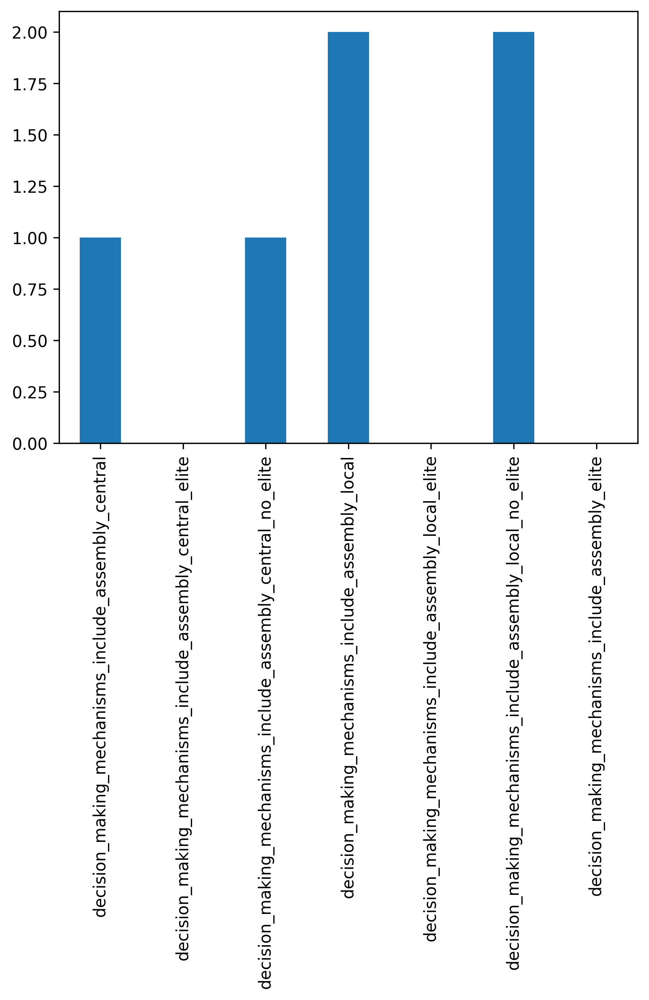

In [80]:
assemblies_df[assemblies].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'assemblies_histogram.png')
plt.show()

In [81]:
# Communities with all three assembly types
assemblies_df[
    (assemblies_df['decision_making_mechanisms_include_assembly_central'] == 1) &
    (assemblies_df['decision_making_mechanisms_include_assembly_local'] == 1) &
    (assemblies_df['decision_making_mechanisms_include_assembly_elite'] == 1)
][['Name'] + assemblies].reset_index(drop=True)

,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite


In [82]:
# Communities with both central + local 
assemblies_df[
    (assemblies_df['decision_making_mechanisms_include_assembly_central'] == 1) &
    (assemblies_df['decision_making_mechanisms_include_assembly_local'] == 1)
][['Name'] + assemblies].reset_index(drop=True)

,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite


In [83]:
# Communities with central + elite
assemblies_df[
    (assemblies_df['decision_making_mechanisms_include_assembly_central'] == 1) &
    (assemblies_df['decision_making_mechanisms_include_assembly_elite'] == 1)
][['Name'] + assemblies].reset_index(drop=True)

,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite


In [84]:
# Communities with central + no elite
assemblies_df[
    (assemblies_df['decision_making_mechanisms_include_assembly_central'] == 1) &
    (assemblies_df['decision_making_mechanisms_include_assembly_elite'] == 0)
][['Name'] + assemblies].reset_index(drop=True)

,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
0,Gilbertese,1,0,1,0,0,0,0


In [85]:
# Communities with local + elite
assemblies_df[
    (assemblies_df['decision_making_mechanisms_include_assembly_local'] == 1) &
    (assemblies_df['decision_making_mechanisms_include_assembly_elite'] == 1)
][['Name'] + assemblies].reset_index(drop=True)

,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite


In [86]:
# Communities with local + no elite
assemblies_df[
    (assemblies_df['decision_making_mechanisms_include_assembly_local'] == 1) &
    (assemblies_df['decision_making_mechanisms_include_assembly_elite'] == 0)
][['Name'] + assemblies].reset_index(drop=True)

,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
0,Maori,0,0,0,1,0,1,0
1,Twana,0,0,0,1,0,1,0


In [87]:
# Communities with exclusively central assemblies
assemblies_df[
    (assemblies_df['decision_making_mechanisms_include_assembly_central'] == 1) &
    (assemblies_df['decision_making_mechanisms_include_assembly_local'] == 0) &
    (assemblies_df['decision_making_mechanisms_include_assembly_elite'] == 0)
][['Name'] + assemblies].reset_index(drop=True)

,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
0,Gilbertese,1,0,1,0,0,0,0


In [88]:
# Communities with exclusively local assemblies
assemblies_df[
    (assemblies_df['decision_making_mechanisms_include_assembly_central'] == 0) &
    (assemblies_df['decision_making_mechanisms_include_assembly_local'] == 1) &
    (assemblies_df['decision_making_mechanisms_include_assembly_elite'] == 0)
][['Name'] + assemblies].reset_index(drop=True)

,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
0,Maori,0,0,0,1,0,1,0
1,Twana,0,0,0,1,0,1,0


In [89]:
# Communities with exclusively elite assemblies
assemblies_df[
    (assemblies_df['decision_making_mechanisms_include_assembly_central'] == 0) &
    (assemblies_df['decision_making_mechanisms_include_assembly_local'] == 0) &
    (assemblies_df['decision_making_mechanisms_include_assembly_elite'] == 1)
][['Name'] + assemblies].reset_index(drop=True)

,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite


#### Size histogram

In [90]:
assemblies_df[size_cols].sum()

Size: 100 - 1,000               1
Size: 1,001 - 10,000            0
Size: 10,001 - 100,000          2
Size: 100,001 - 1,000,000       0
Size: 1,000,001 - 10,000,000    0
Size: 10,000,000+               0
Size: Unknown                   0
dtype: int64

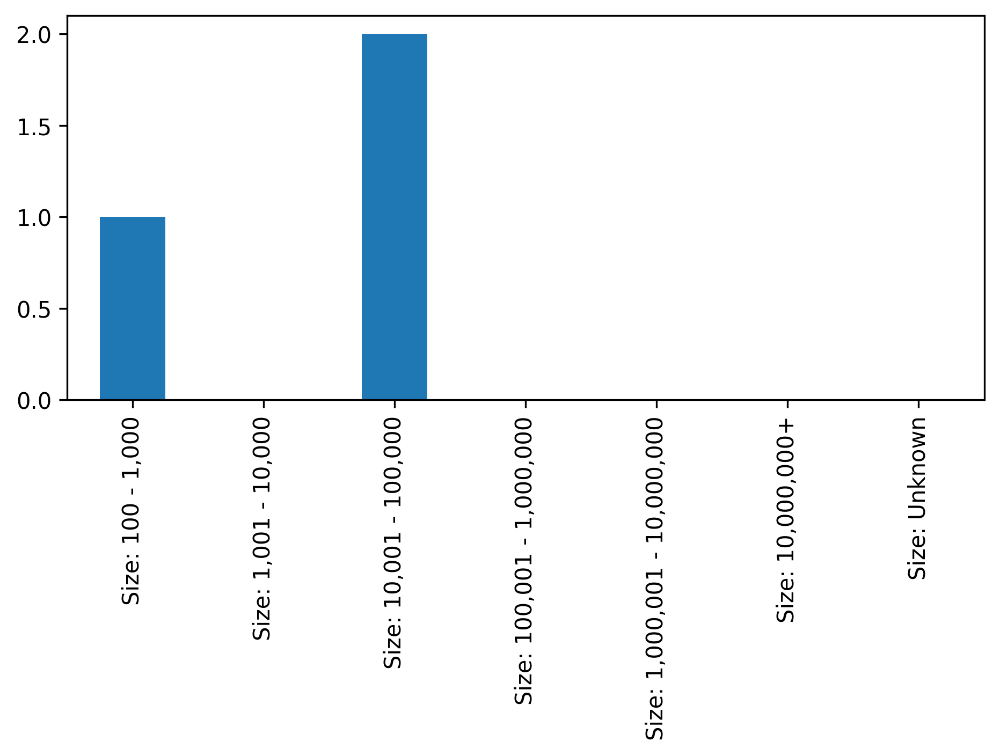

In [91]:
assemblies_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'assemblies_size_histogram.png')
plt.show()

## Plotting Assembly Timelines 

#### Central Assemblies

In [92]:
central_assemblies_df = assemblies_df[assemblies_df['decision_making_mechanisms_include_assembly_central'] == 1]

In [93]:
central_dates_df = central_assemblies_df[['Time span: Start', 'Time span: Duration', 'Name'] + assemblies]

In [94]:
central_dates_df.head()

,Time span: Start,Time span: Duration,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
72,1400,500,Gilbertese,1,0,1,0,0,0,0


In [95]:
central_dates_tuples = [tuple(x) for x in central_dates_df.to_numpy()]
central_dates_tuples

[(1400, 500, 'Gilbertese', 1, 0, 1, 0, 0, 0, 0)]

In [96]:
list(central_dates_df.columns.values)

['Time span: Start',
 'Time span: Duration',
 'Name',
 'decision_making_mechanisms_include_assembly_central',
 'decision_making_mechanisms_include_assembly_central_elite',
 'decision_making_mechanisms_include_assembly_central_no_elite',
 'decision_making_mechanisms_include_assembly_local',
 'decision_making_mechanisms_include_assembly_local_elite',
 'decision_making_mechanisms_include_assembly_local_no_elite',
 'decision_making_mechanisms_include_assembly_elite']

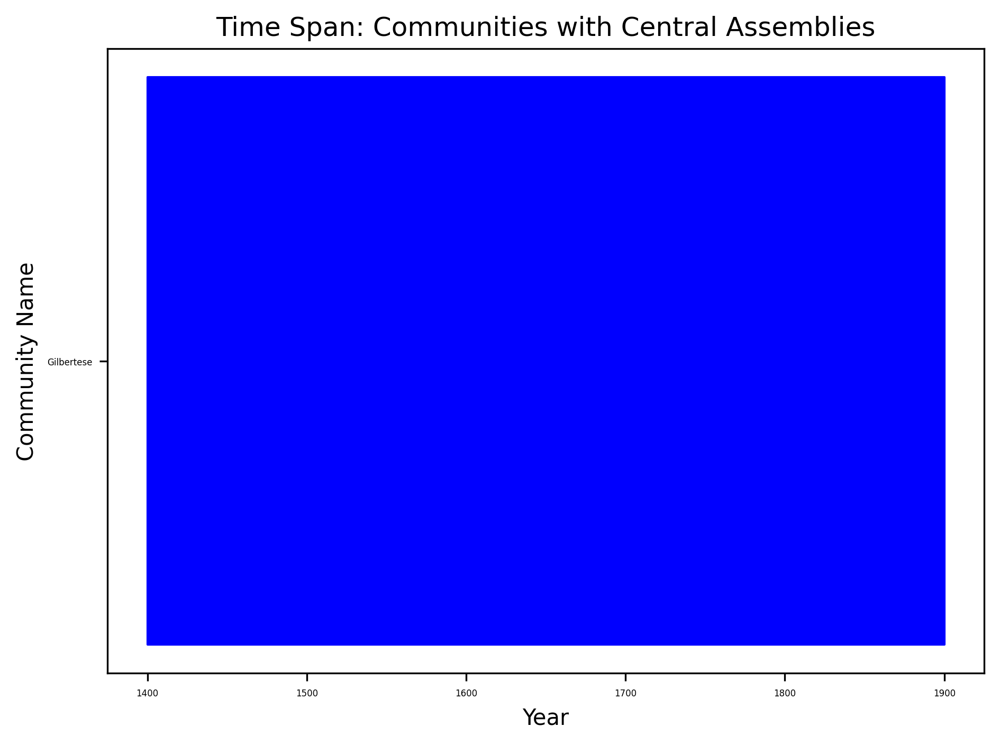

In [97]:
# create figure and plot
fig, ax = plt.subplots()
labels = []
for i, (
    start, 
    duration, 
    label, 
    is_central, 
    is_central_elite, 
    is_central_no_elite, 
    is_local, 
    is_local_elite, 
    is_local_no_elite, 
    is_elite
) in enumerate(central_dates_tuples):
    if is_elite:
        bar_color = 'purple'
    else:
        bar_color = 'blue'
    
    labels.append(label)
    ax.broken_barh(
        [(start, duration)], 
        (i-0.4,0.8),
        color=bar_color
    )
    
# set yticks at the middle of the bars
ax.set_yticks(range(len(central_dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='both', which='major', labelsize=4)

ax.set_xlabel('Year')
ax.set_ylabel('Community Name')

plt.title('Time Span: Communities with Central Assemblies')
# plt.figure(figsize=(80, 80))

plt.tight_layout()
plt.savefig(fig_dir + 'timeline_central_assemblies.png')
plt.show()

#### Local Assemblies

In [98]:
local_assemblies_df = assemblies_df[assemblies_df['decision_making_mechanisms_include_assembly_local'] == 1]

In [99]:
local_dates_df = local_assemblies_df[['Time span: Start', 'Time span: Duration', 'Name'] + assemblies]

In [100]:
local_dates_df.head()

,Time span: Start,Time span: Duration,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
69,1700,200,Maori,0,0,0,1,0,1,0
88,1800,100,Twana,0,0,0,1,0,1,0


In [101]:
local_dates_tuples = [tuple(x) for x in local_dates_df.to_numpy()]
local_dates_tuples

[(1700, 200, 'Maori', 0, 0, 0, 1, 0, 1, 0),
 (1800, 100, 'Twana', 0, 0, 0, 1, 0, 1, 0)]

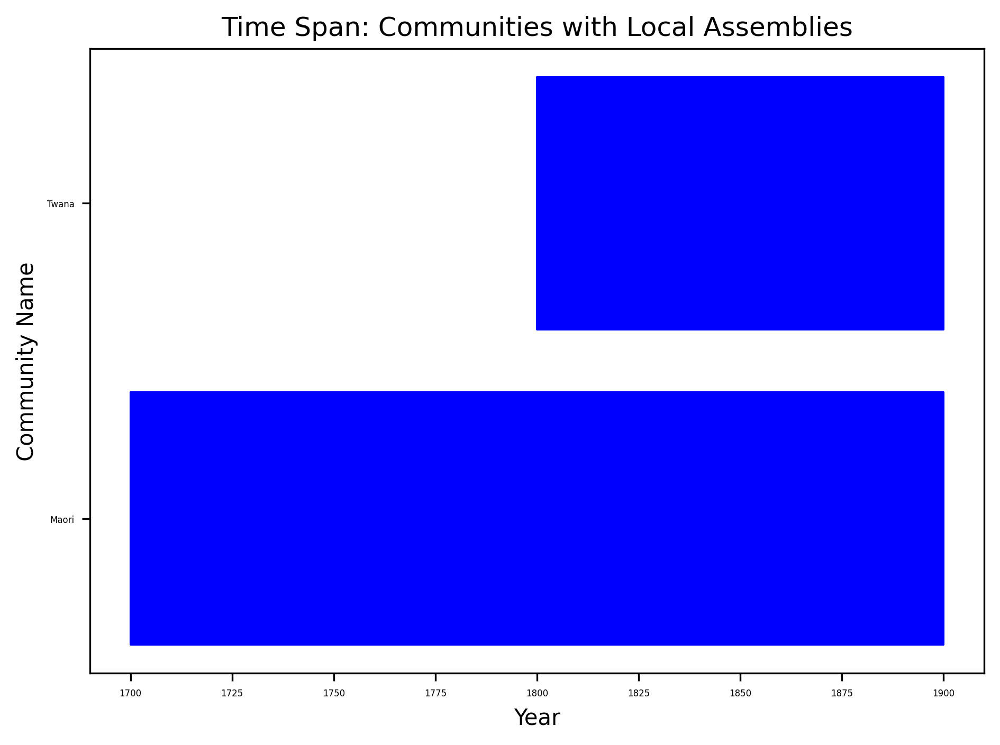

In [102]:
# create figure and plot
fig, ax = plt.subplots()
labels = []
for i, (
    start, 
    duration, 
    label, 
    is_central, 
    is_central_elite, 
    is_central_no_elite, 
    is_local, 
    is_local_elite, 
    is_local_no_elite, 
    is_elite
) in enumerate(local_dates_tuples):
    if is_elite:
        bar_color = 'purple'
    else:
        bar_color = 'blue'
    
    labels.append(label)
    ax.broken_barh(
        [(start, duration)], 
        (i-0.4,0.8),
        color=bar_color
)

# set yticks at the middle of the bars
ax.set_yticks(range(len(local_dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='both', which='major', labelsize=4)

ax.set_xlabel('Year')
ax.set_ylabel('Community Name')

plt.title('Time Span: Communities with Local Assemblies')
# plt.figure(figsize=(80, 80))

plt.tight_layout()
plt.savefig(fig_dir + 'timeline_local_assemblies.png')
plt.show()

#### Elite Assemblies

In [103]:
elite_assemblies_df = assemblies_df[assemblies_df['decision_making_mechanisms_include_assembly_elite'] == 1]

In [104]:
elite_dates_df = elite_assemblies_df[['Time span: Start', 'Time span: Duration', 'Name'] + assemblies]

In [105]:
elite_dates_df.head()

,Time span: Start,Time span: Duration,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite


In [106]:
elite_dates_tuples = [tuple(x) for x in elite_dates_df.to_numpy()]
elite_dates_tuples

[]

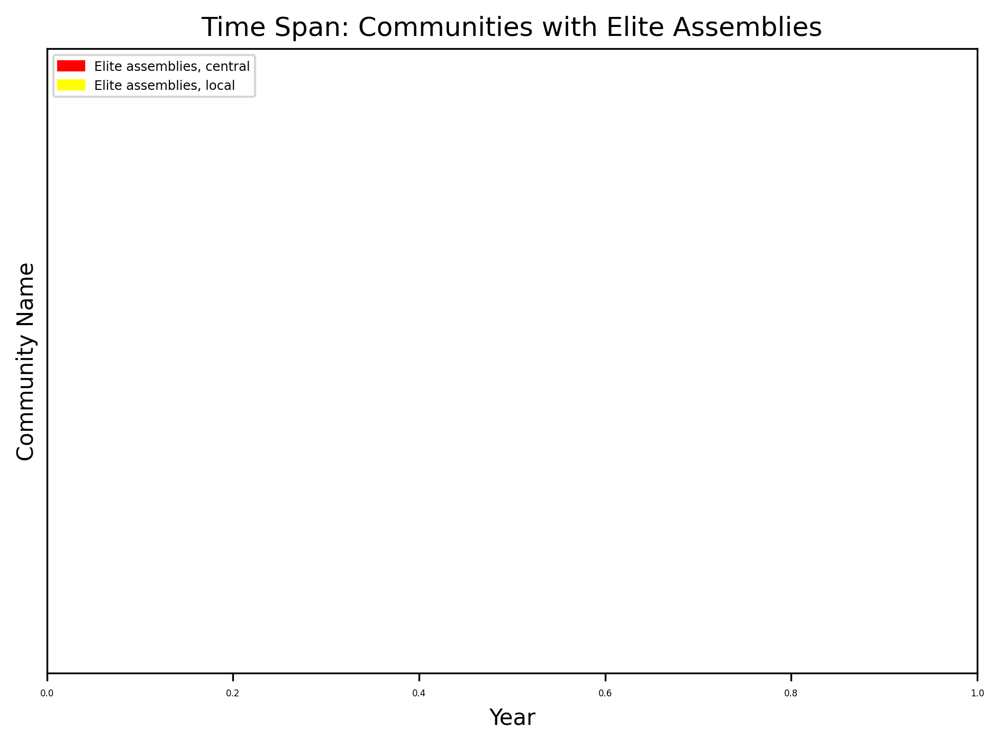

In [107]:
# create figure and plot
fig, ax = plt.subplots()
labels = []
for i, (
    start, 
    duration, 
    label, 
    is_central, 
    is_central_elite, 
    is_central_no_elite, 
    is_local, 
    is_local_elite, 
    is_local_no_elite, 
    is_elite
) in enumerate(elite_dates_tuples):
    if is_central:
        bar_color = 'red'
    else:
        bar_color = 'yellow'
    
    labels.append(label)
    ax.broken_barh(
        [(start, duration)], 
        (i-0.4,0.8),
        color=bar_color
)

# set yticks at the middle of the bars
ax.set_yticks(range(len(elite_dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='both', which='major', labelsize=4)

ax.set_xlabel('Year')
ax.set_ylabel('Community Name')

plt.title('Time Span: Communities with Elite Assemblies')
# plt.figure(figsize=(80, 80))

# Create legend
red_patch = mpatches.Patch(color='red', label='Elite assemblies, central')
yellow_patch = mpatches.Patch(color='yellow', label='Elite assemblies, local')

ax.legend(
    handles=[
        red_patch,
        yellow_patch,
    ],
    loc='upper left',
    fontsize='xx-small'
)

plt.tight_layout()
plt.savefig(fig_dir + 'timeline_elite_assemblies.png')
plt.show()

#### All Assembly Types

In [108]:
all_dates_df = assemblies_df[['Time span: Start', 'Time span: Duration', 'Name'] + assemblies]

In [109]:
all_dates_df.head()

,Time span: Start,Time span: Duration,Name,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_assembly_central_elite,decision_making_mechanisms_include_assembly_central_no_elite,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_assembly_local_elite,decision_making_mechanisms_include_assembly_local_no_elite,decision_making_mechanisms_include_assembly_elite
69,1700,200,Maori,0,0,0,1,0,1,0
72,1400,500,Gilbertese,1,0,1,0,0,0,0
88,1800,100,Twana,0,0,0,1,0,1,0


In [110]:
all_dates_tuples = [tuple(x) for x in all_dates_df.to_numpy()]
all_dates_tuples

[(1700, 200, 'Maori', 0, 0, 0, 1, 0, 1, 0),
 (1400, 500, 'Gilbertese', 1, 0, 1, 0, 0, 0, 0),
 (1800, 100, 'Twana', 0, 0, 0, 1, 0, 1, 0)]

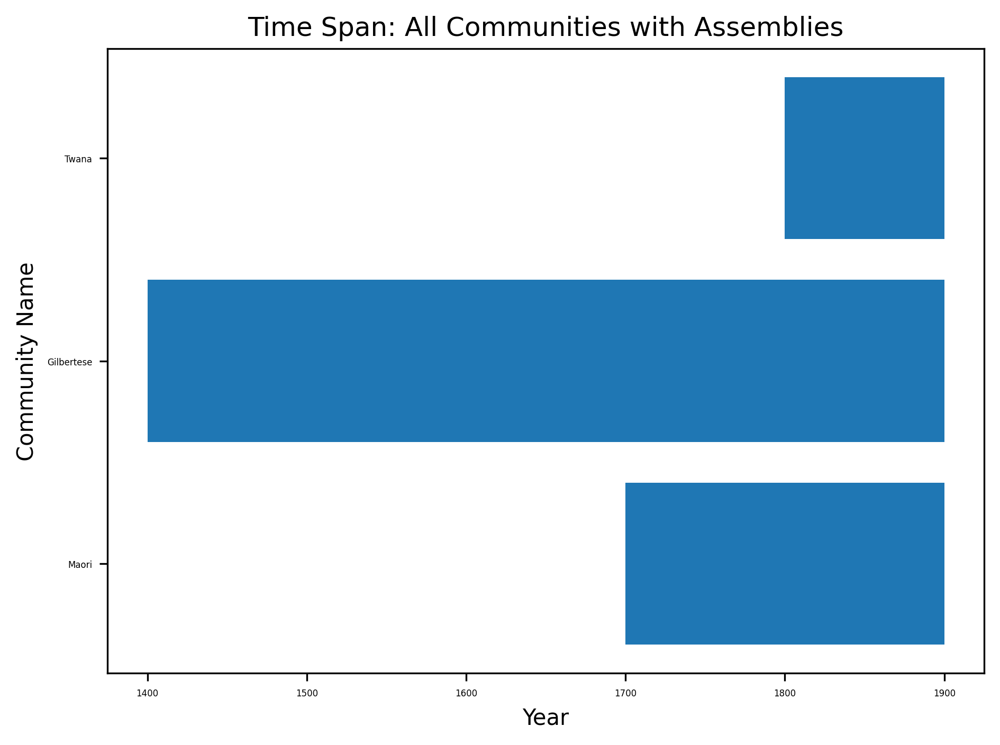

In [111]:
# Create figure and plot
fig, ax = plt.subplots()
labels = []

for i, (
    start, 
    duration, 
    label, 
    is_central, 
    is_central_elite, 
    is_central_no_elite, 
    is_local, 
    is_local_elite, 
    is_local_no_elite, 
    is_elite
) in enumerate(all_dates_tuples):
    labels.append(label)
    ax.broken_barh(
        [(start, duration)], 
        (i-0.4,0.8)
    )

# Set yticks at the middle of the bars
ax.set_yticks(range(len(all_dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='both', which='major', labelsize=4)

ax.set_xlabel('Year')
ax.set_ylabel('Community Name')

plt.title('Time Span: All Communities with Assemblies')
# plt.figure(figsize=(80, 80))

plt.tight_layout()
plt.savefig(fig_dir + 'timeline_assemblies_basic.png')
plt.show()

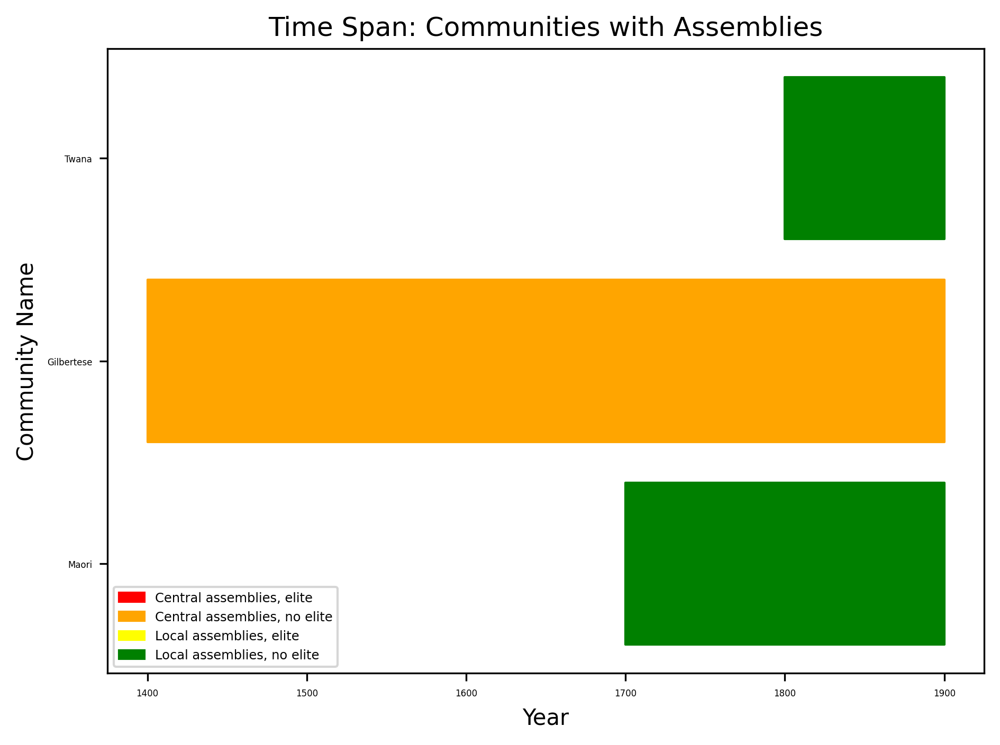

In [112]:
# Create figure and plot
fig, ax = plt.subplots()
labels = []

for i, (
    start, 
    duration, 
    label, 
    is_central, 
    is_central_elite, 
    is_central_no_elite, 
    is_local, 
    is_local_elite, 
    is_local_no_elite, 
    is_elite
) in enumerate(all_dates_tuples):
    
    # Set color based on assembly type
    if is_central_elite:
        bar_color = 'red'
    elif is_central_no_elite:
        bar_color = 'orange'
    
    elif is_local_elite:
        bar_color = 'yellow'
    elif is_local_no_elite:
        bar_color = 'green'
        
    else:
        bar_color = 'grey'
    
    labels.append(label)
    ax.broken_barh(
        [(start, duration)], 
        (i-0.4,0.8),
        color=bar_color
    )

# Set yticks at the middle of the bars
ax.set_yticks(range(len(all_dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='both', which='major', labelsize=4)

ax.set_xlabel('Year')
ax.set_ylabel('Community Name')

# Create legend
red_patch = mpatches.Patch(color='red', label='Central assemblies, elite')
orange_patch = mpatches.Patch(color='orange', label='Central assemblies, no elite')
yellow_patch = mpatches.Patch(color='yellow', label='Local assemblies, elite')
green_patch = mpatches.Patch(color='green', label='Local assemblies, no elite')

ax.legend(
    handles=[
        red_patch,
        orange_patch,
        yellow_patch,
        green_patch,
    ],
    loc='lower left',
    fontsize='xx-small'
)

plt.title('Time Span: Communities with Assemblies')
# plt.figure(figsize=(80, 80))

plt.tight_layout()
plt.savefig(fig_dir + 'timeline_assemblies.png')
plt.show()

## Mapping Assembly Regions

#### Prep map data

In [113]:
worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_67532/3744710904.py:1: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


In [114]:
worldmap.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [115]:
central_america_countries = [
    'Belize',
    'Costa Rica',
    'El Salvador',
    'Guatemala',
    'Honduras',
    'Nicaragua',
    'Panama'
]

In [116]:
middle_east_countries = [
    'Cyprus',
    'Egypt',
    'Iran',
    'Iraq',
    'Israel',
    'Jordan',
    'Kuwait',
    'Lebanon',
    'Oman',
    'Palestine',
    'Qatar',
    'Saudi Arabia',
    'Syria',
    'Turkey',
    'United Arab Emirates',
    'Yemen'
]

In [117]:
# Add region for Central America
worldmap.loc[(worldmap['name'].isin(central_america_countries)), 'continent'] = 'Central America'

In [118]:
# Add region for Middle East
worldmap.loc[(worldmap['name'].isin(middle_east_countries)), 'continent'] = 'Middle East'

In [119]:
worldmap['continent'].value_counts()

continent
Africa                     50
Europe                     39
Asia                       32
Middle East                16
South America              13
North America              11
Oceania                     7
Central America             7
Seven seas (open ocean)     1
Antarctica                  1
Name: count, dtype: int64

##### Merge regions on world map

In [120]:
region_map = gpd.GeoDataFrame(columns=['Region', 'geometry'])

In [121]:
regions_list = list(gov_df['Region'].unique())

In [122]:
region_map['Region'] = regions_list

In [123]:
region_map['geometry'].loc[region_map['Region'] == 'Africa'] = worldmap.loc[(worldmap['continent'] == 'Africa')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Europe'] = worldmap.loc[(worldmap['continent'] == 'Europe')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Asia'] = worldmap.loc[(worldmap['continent'] == 'Asia')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Middle East'] = worldmap.loc[(worldmap['continent'] == 'Middle East')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'North America'] = worldmap.loc[(worldmap['continent'] == 'North America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Central America'] = worldmap.loc[(worldmap['continent'] == 'Central America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'South America'] = worldmap.loc[(worldmap['continent'] == 'South America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Oceania'] = worldmap.loc[(worldmap['continent'] == 'Oceania')].unary_union

In [124]:
region_map

,Region,geometry
0,South America,"MULTIPOLYGON (((-68.63999 -55.58002, -69.23210..."
1,Oceania,"MULTIPOLYGON (((147.91405 -43.21152, 147.56456..."
2,Asia,"MULTIPOLYGON (((105.85745 -4.30552, 105.81766 ..."
3,Africa,"MULTIPOLYGON (((-11.43878 6.78592, -11.70819 6..."
4,North America,"MULTIPOLYGON (((-155.22217 19.23972, -155.5421..."
5,Central America,"POLYGON ((-77.24257 7.93528, -77.43111 7.63806..."


In [125]:
assemblies_region_map = region_map

In [126]:
all_regions_df = pd.DataFrame(
    [
        ['North America',0],
        ['South America', 0],
        ['Europe',0],
        ['Asia',0],
        ['Middle East',0],
        ['Africa',0],
        ['Central America',0],
        ['Oceania',0]
    ], 
    columns=['Region', 'Count']
)

all_regions_df

,Region,Count
0,North America,0
1,South America,0
2,Europe,0
3,Asia,0
4,Middle East,0
5,Africa,0
6,Central America,0
7,Oceania,0


In [127]:
assemblies_region_counts = assemblies_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')
assemblies_region_counts

,Region,Count
0,Oceania,2
1,North America,1


Note: Missing regions include North America, South America

In [128]:
all_assemblies_regions = pd.merge(assemblies_region_counts, all_regions_df, how='outer')
all_assemblies_regions.drop_duplicates(subset=['Region'], keep='first', inplace=True, ignore_index=True)
all_assemblies_regions

,Region,Count
0,Oceania,2
1,North America,1
2,South America,0
3,Europe,0
4,Asia,0
5,Middle East,0
6,Africa,0
7,Central America,0


In [129]:
merged_regions = pd.merge(assemblies_region_map, all_assemblies_regions, on='Region')
merged_regions

,Region,geometry,Count
0,South America,"MULTIPOLYGON (((-68.63999 -55.58002, -69.23210...",0
1,Oceania,"MULTIPOLYGON (((147.91405 -43.21152, 147.56456...",2
2,Asia,"MULTIPOLYGON (((105.85745 -4.30552, 105.81766 ...",0
3,Africa,"MULTIPOLYGON (((-11.43878 6.78592, -11.70819 6...",0
4,North America,"MULTIPOLYGON (((-155.22217 19.23972, -155.5421...",1
5,Central America,"POLYGON ((-77.24257 7.93528, -77.43111 7.63806...",0


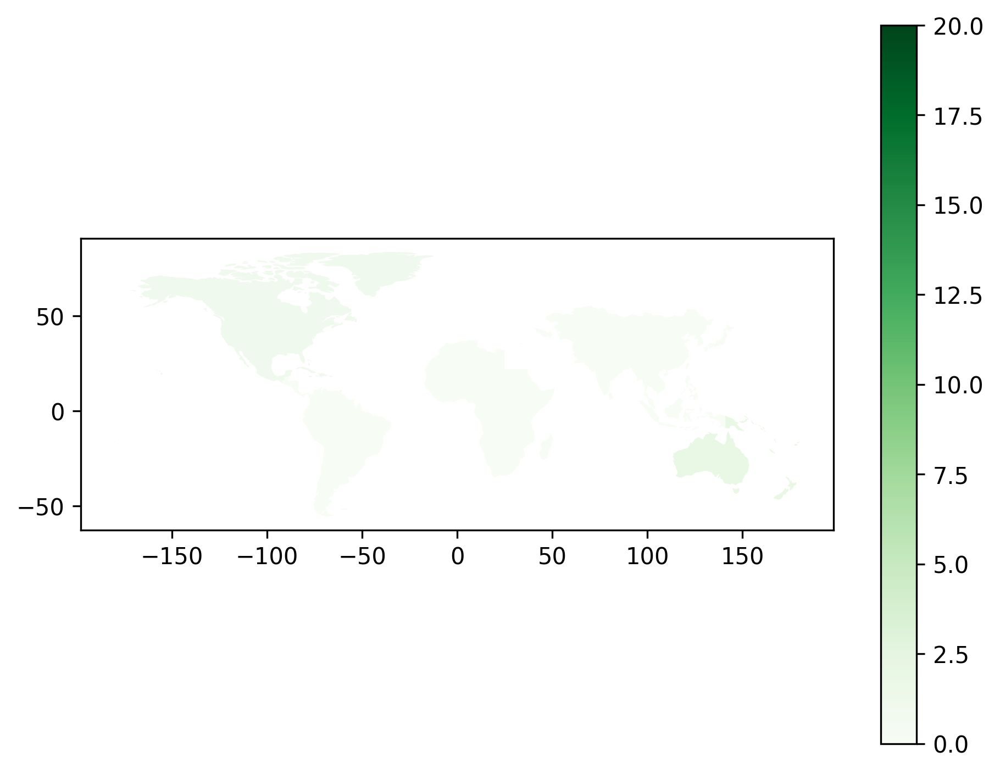

In [130]:
merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=20
)

plt.tight_layout()
plt.savefig(fig_dir + 'map_all_assemblies.png')
plt.show()

### Central, all

In [131]:
central_assemblies_region_counts = central_assemblies_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')
central_assemblies_region_counts

,Region,Count
0,Oceania,1


In [132]:
all_central_regions = pd.merge(central_assemblies_region_counts, all_regions_df, how='outer')
all_central_regions.drop_duplicates(subset=['Region'], keep='first', inplace=True, ignore_index=True)
all_central_regions

,Region,Count
0,Oceania,1
1,North America,0
2,South America,0
3,Europe,0
4,Asia,0
5,Middle East,0
6,Africa,0
7,Central America,0


In [133]:
central_merged_regions = pd.merge(region_map, all_central_regions, on='Region')

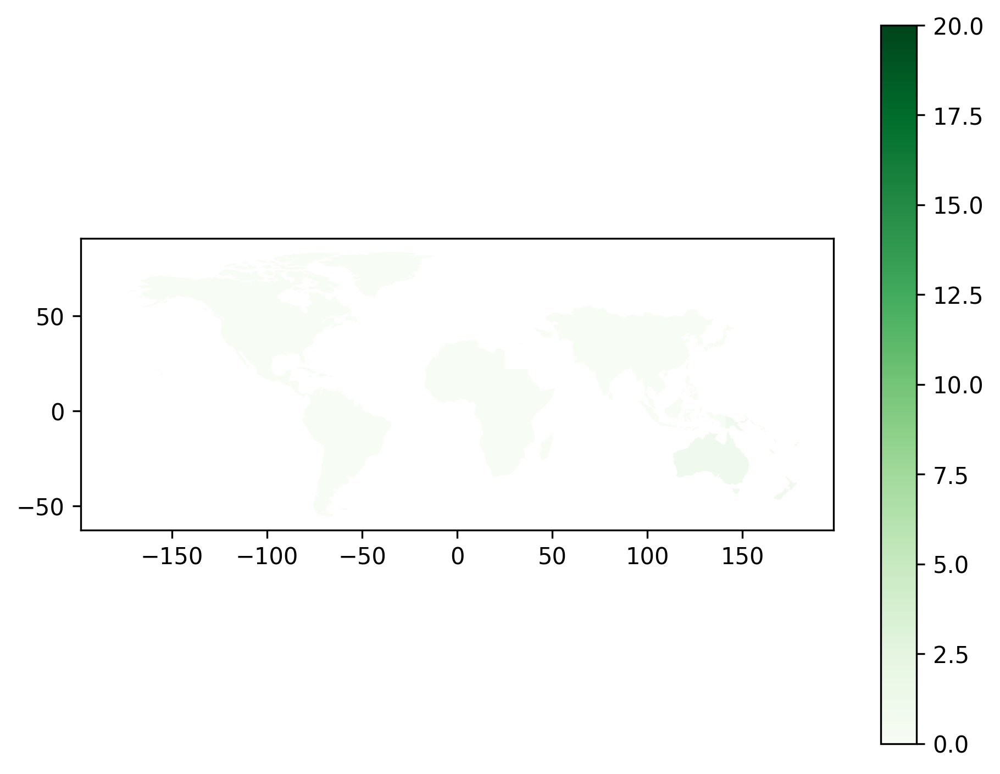

In [134]:
central_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=20
)

plt.tight_layout()
plt.savefig(fig_dir + 'map_central_assemblies.png')
plt.show()

### Central, elite

In [135]:
central_elite_assemblies_df = central_assemblies_df.loc[central_assemblies_df['decision_making_mechanisms_include_assembly_central_elite'] == 1]

In [136]:
central_elite_assemblies_region_counts = central_elite_assemblies_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [137]:
all_central_elite_regions = pd.merge(central_elite_assemblies_region_counts, all_regions_df, how='outer')
all_central_elite_regions.drop_duplicates(subset=['Region'], keep='first', inplace=True, ignore_index=True)
all_central_elite_regions

,Region,Count
0,North America,0
1,South America,0
2,Europe,0
3,Asia,0
4,Middle East,0
5,Africa,0
6,Central America,0
7,Oceania,0


In [138]:
central_elite_merged_regions = pd.merge(region_map, all_central_elite_regions, on='Region')

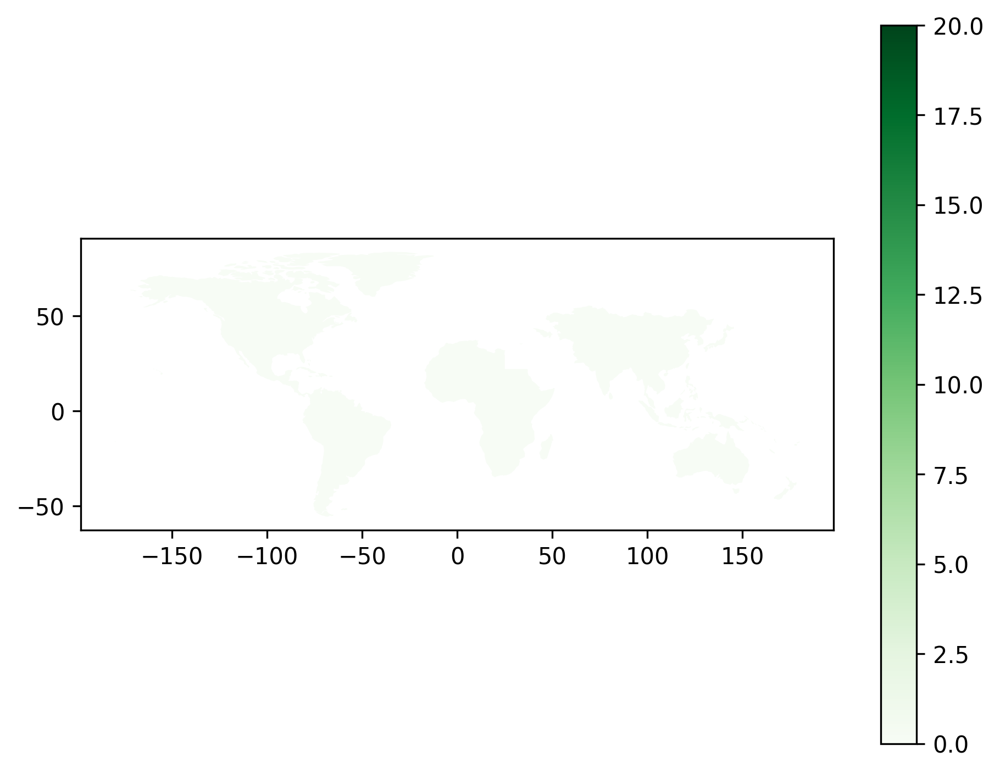

In [139]:
central_elite_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=20
)

plt.tight_layout()
plt.savefig(fig_dir + 'map_central_elite_assemblies.png')
plt.show()

### Central, no elite

In [140]:
central_no_elite_assemblies_df = central_assemblies_df.loc[central_assemblies_df['decision_making_mechanisms_include_assembly_central_no_elite'] == 1]

In [141]:
central_no_elite_assemblies_region_counts = central_no_elite_assemblies_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

all_central_no_elite_regions = pd.merge(central_no_elite_assemblies_region_counts, all_regions_df, how='outer')
all_central_no_elite_regions.drop_duplicates(subset=['Region'], keep='first', inplace=True, ignore_index=True)
all_central_no_elite_regions

central_no_elite_merged_regions = pd.merge(region_map, all_central_no_elite_regions, on='Region')

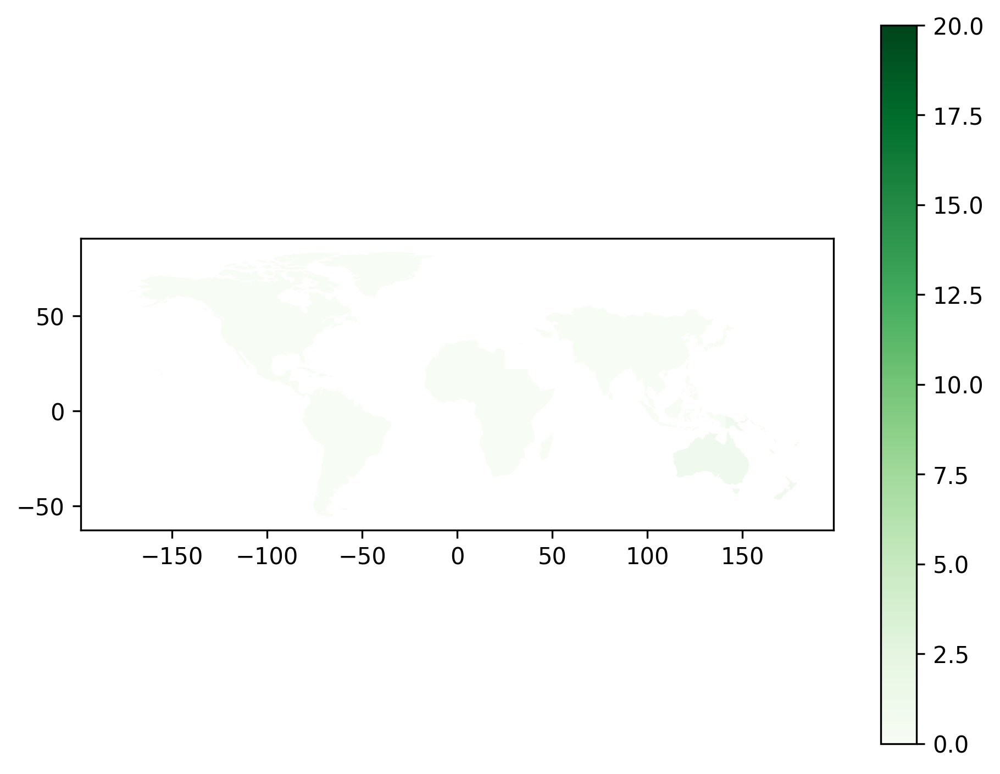

In [142]:
central_no_elite_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=20
)

plt.tight_layout()
plt.savefig(fig_dir + 'map_central_no_elite_assemblies.png')
plt.show()

### Local, all

In [143]:
local_assemblies_region_counts = local_assemblies_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')
local_assemblies_region_counts

,Region,Count
0,Oceania,1
1,North America,1


In [144]:
local_merged_regions = pd.merge(region_map, local_assemblies_region_counts, on='Region')

In [145]:
all_local_regions = pd.merge(local_assemblies_region_counts, all_regions_df, how='outer')
all_local_regions.drop_duplicates(subset=['Region'], keep='first', inplace=True, ignore_index=True)
all_local_regions

local_merged_regions = pd.merge(region_map, all_local_regions, on='Region')

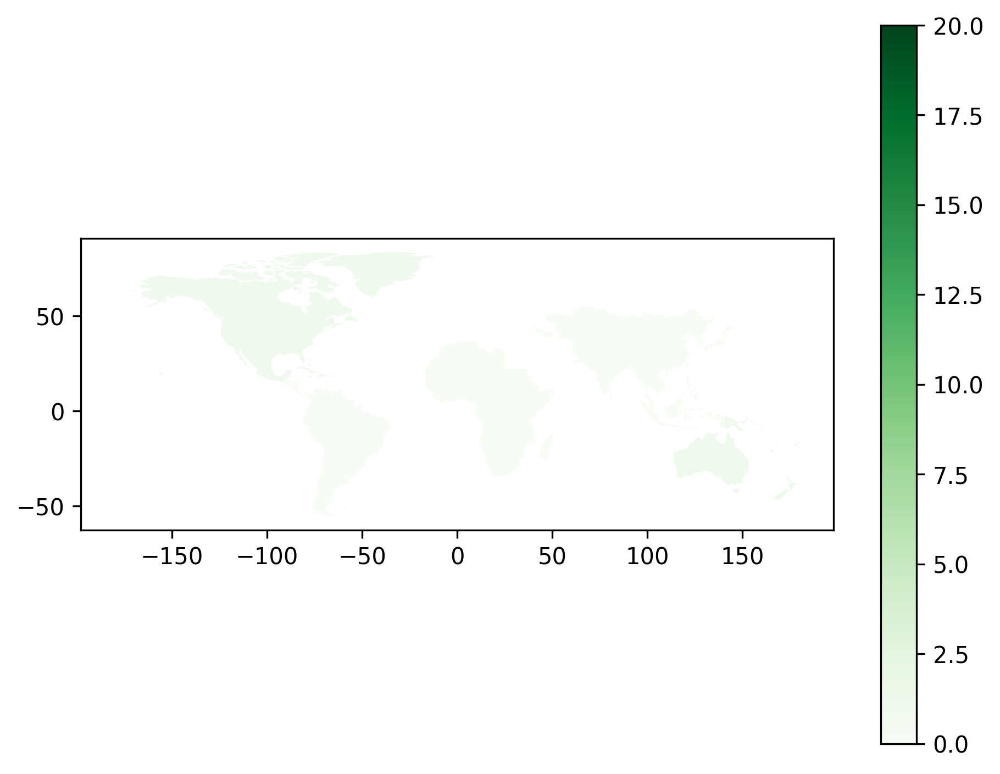

In [146]:
local_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=20
)

plt.tight_layout()
plt.savefig(fig_dir + 'map_local_assemblies.png')
plt.show()

### Local, elite

In [147]:
local_elite_assemblies_df = local_assemblies_df.loc[local_assemblies_df['decision_making_mechanisms_include_assembly_local_elite'] == 1]

In [148]:
local_elite_assemblies_region_counts = local_elite_assemblies_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

local_elite_regions = pd.merge(local_elite_assemblies_region_counts, all_regions_df, how='outer')
local_elite_regions.drop_duplicates(subset=['Region'], keep='first', inplace=True, ignore_index=True)
local_elite_regions

local_elite_merged_regions = pd.merge(region_map, local_elite_regions, on='Region')

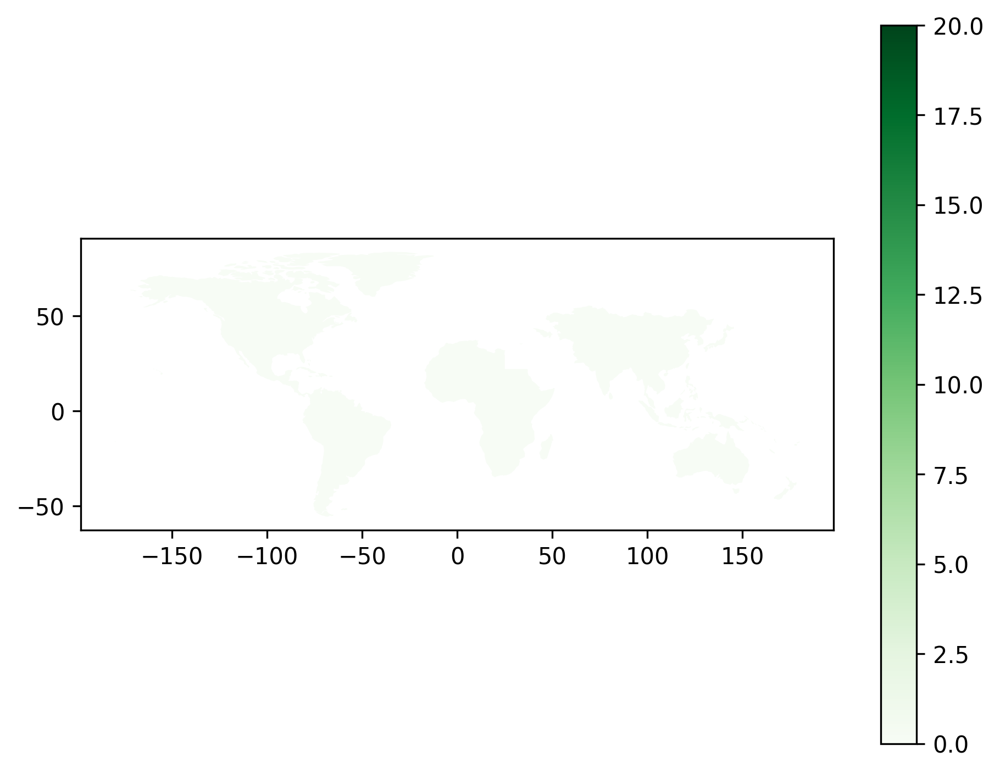

In [149]:
local_elite_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=20
)

plt.tight_layout()
plt.savefig(fig_dir + 'map_local_elite_assemblies.png')
plt.show()

### Local, no elite

In [150]:
local_no_elite_assemblies_df = local_assemblies_df.loc[local_assemblies_df['decision_making_mechanisms_include_assembly_local_no_elite'] == 1]

In [151]:
local_no_elite_assemblies_region_counts = local_no_elite_assemblies_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

local_no_elite_regions = pd.merge(local_no_elite_assemblies_region_counts, all_regions_df, how='outer')
local_no_elite_regions.drop_duplicates(subset=['Region'], keep='first', inplace=True, ignore_index=True)
local_no_elite_regions

local_no_elite_merged_regions = pd.merge(region_map, local_no_elite_regions, on='Region')

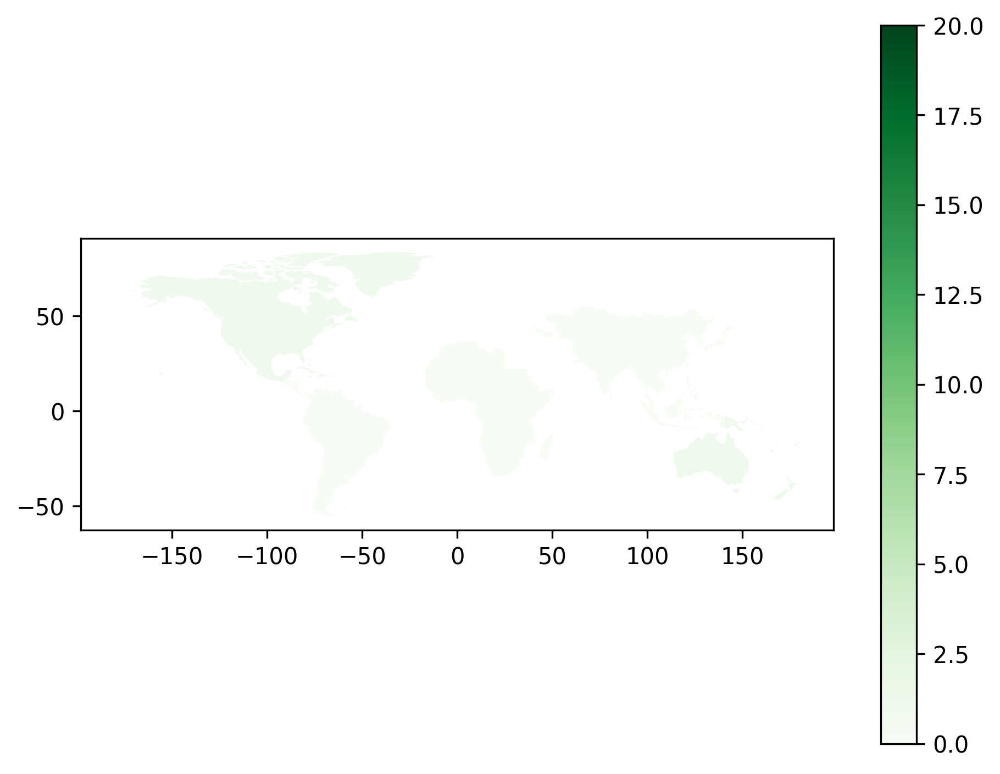

In [152]:
local_no_elite_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=20
)

plt.tight_layout()
plt.savefig(fig_dir + 'map_local_no_elite_assemblies.png')
plt.show()